In [1]:
# Tested on python 3.8.3
!python -V
# Install the require pacakges using poetry.
# !conda install -c anaconda graphviz -y
# !pip install poetry && python -m poetry install --no-root

Python 3.8.3


# Stock market price prediction
## What is the stock market?
The stock market is a place where people and companies can buy and sell shares of companies and commodities.
People go to the stock market in the hopes of investing money in the place which will give them their best ROI(return on investment)
## How the stock market works?
In the market, each item has a price, which is decided according to the demand and supply.
If there are more people who want to buy a share of AAPL(Apple Inc.), the price will go up, otherwise, the price will go down.
When one wants to buy (buy order), he hopes that the price will go up in the future, where he could sell the stock and  profit on the difference.
If Alice wants to sell AAPL share, lets say at 40\\$ minimum, she can only sell if there is a buyer, let's say bob, who agrees to buy at 40\\$ or more.
This can only be achieved if Alice believe that AAPL is **overpriced** and Bob believe the AAPL is **underpriced**.

## What is the problem?
If one could know for sure, at all times, if a share is underpriced or overpriced, one could always profit in the stock market. 
The stock price is aim to reflect the value of the company - if APPL has 4 million shared, 100 \\$ each, 
then AAPL is worth 400 \\$ million. 
The value of the stock is then thorised to be the "the wisdom of the crowd", and is composed of the aggregated knowledge of all the shareholders and investors.
These knowledge might contain hidden(inside knowledge) and public(cash flow, debts, yearly profits) parameters which can affect the value of the company.
One company can also be influenced by another, if Sumsung price go up because of a new phone release, Apple price might go down.
Knowing and taking all these parameters into account is not an easy task.

## Solutions
Naturally, when a lot of money is involved, A lot of people are trying to make sense of the stock market, and developed many ways to try and gain a little knowledge about the stock value before all the other investors do. 
* **tehcincal indicators** - creating indicators that should give some hints at where the stock is going to go(moving averages, high volumes thresholds, etc)
* **technical analysis** - trying to find some patterns that are said to be correlative with up/down movement in the price.
* **fundamental anaylsis** - analysing the companies quartly reports, trying to make sense of the profits, debts, etc.
* **Social media** - analysis social media sentiment about the company(tweeter, facebook, news reports).





<h1 id="tocheading">Table of Contents</h1>
<div id="toc"></div>

In [2]:
%%javascript
// Auto create the table of contents
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

# Data overview
The data is provided by [this kaggle competition](https://www.kaggle.com/dgawlik/nyse?select=prices-split-adjusted.csv)  
Dataset consists of following files:

1. **prices.csv**: raw, as-is daily prices. Most of data spans from 2010 to the end 2016, for companies new on stock market date range is shorter. There have been approx. 140 stock splits in that time, this set doesn't account for that.
2. **prices-split-adjusted.csv**: same as prices, but there have been added adjustments for splits.
3. **securities.csv**: general description of each company with division on sectors
4. **fundamentals.csv**: metrics extracted from annual SEC 10K fillings (2012-2016), should be enough to derive most of popular fundamental indicators.

I'll be focused in this project only on the prices-split-adjusted file. 
The csv has the following headers:
* date - single trading day
* symbol - ticker - the shortened name of the company
* open - the open(first) price value of the day
* close - the close(last) price value of the day
* low - the lowest price value of the day
* high - the highest price value of the day
* volume - number of transactions in a day. 
  
During my work on the LSTM-NN model, I found the the size of the data is too small.  
This is why I switch for this [source](https://www.kaggle.com/borismarjanovic/price-volume-data-for-all-us-stocks-etfs).   
It contains of much more data.

In [3]:
import warnings
# Data manipulation
import pandas as pd  
import numpy as np

# Visualization
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
from tqdm.notebook import tqdm, trange
import seaborn as sns
from IPython.display import display, clear_output


init_notebook_mode(connected=True)
tqdm.pandas()

/Users/itay/opt/miniconda3/envs/unids/lib/python3.8/site-packages/tqdm/std.py:697: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



In [4]:
prices = pd.read_csv("./prices-split-adjusted.csv", parse_dates=["date"], index_col="date") 
prices[prices['symbol']=="AAPL"].head()

,symbol,open,close,low,high,volume
date,,,,,,
2010-01-04,AAPL,30.490000,30.572857,30.340000,30.642857,123432400.0
2010-01-05,AAPL,30.657143,30.625713,30.464285,30.798571,150476200.0
2010-01-06,AAPL,30.625713,30.138571,30.107143,30.747143,138040000.0
2010-01-07,AAPL,30.250000,30.082857,29.864286,30.285715,119282800.0
2010-01-08,AAPL,30.042856,30.282858,29.865715,30.285715,111902700.0


## Train-Test Split
**No Peaking!**   
First things first - Let's take 15% of the data and set it aside for testing our result in the end.  
In this task we are trying to predict the future. If we want to trust our results, it is important that we set aside some part of the data.  
We need to make sure that there are no features or assumptions we make based on unavailable knowledge.    
We will make the split time-based, since this is a time-series problem, and we want to predict the future.   
 

In [5]:
class Data:
    """
    Helper class to handle splitted train/test data
    """
    def __init__(self, all_data):
        # Read the data from the file
        self._all_data = all_data
        train, test = self._temporal_split(self._all_data, split=0.85)
        self._all_train = train
        # Split 15% of the data to test
        self._test = test
        # Split 20% of the data to train/validation
        self._train, self._validation = self._temporal_split(train, 0.8)
        
    @staticmethod
    def _temporal_split(df, split=0.2):
        """
        Temporal train test split by column value. 
        Not using default existing version because they dont look at the value of a specific column.
        """
        day = df.index
        split_val = day.unique()[int(len(day.unique())*split)]
        return df[day<split_val], df[day>=split_val]
    
    @staticmethod
    def _df(df, symbol):
        return df[df.symbol.str.match(symbol)]
    
    def df(self, symbol):
        return self._df(self._all_train, symbol).copy()
    
    def train(self, symbol=None):
        if symbol:
            return self._df(self._train, symbol).copy()
        return self._train.copy()
    
    def val(self, symbol=None):
        if symbol:
            return self._df(self._validation, symbol).copy()
        return self._validation.copy()
    
    def test(self, symbol=None):
        if symbol:
            return self._df(self._test, symbol).copy()
        return self._test.copy()
    
    def all_data(self, symbol=None):
        """Warning: Don't do anything smart with this, it contains all the data, including validation"""
        warnings.warn(("Requested all data. Don't do anything smart with this,"
                      " it contains all the data, including test data."), 
                      UserWarning)
        if symbol:
            return self._df(self._all_data, symbol).copy()
        return self._all_data.copy()

df = pd.read_csv("./prices-split-adjusted.csv", parse_dates=["date"], index_col="date")
prices = Data(df)
del df


# Plotting utilites
def plot_price(df, title=None, hover_data=("open", "high","low"), color="symbol", ycol="close"):
    return px.line(data_frame=df,
                   y=ycol,
                   color=color,
                   hover_data=hover_data,
                   x=df.index, title=title)

def plot_volume(df, title=None):
    df = df.groupby([pd.Grouper(level="date", freq="Q"),"symbol"]).sum().reset_index()
    return px.bar(df, "date", y="volume", color="symbol", 
                  barmode='group',title=title)
    


We want to extract extra information from each ticket data.

We'll focus on the `close` price, since it's usually close to the `open`/`low`/`high` prices, and the volume. 

## Close price and volume
We'll plot close price and volume for sample of symbols..
Volume is plotted as sum in quarters, in order to make the graph easier to understand

In [6]:
df = prices.df('GOOGL|AAPL|^FB$|MSFT')
plot_price(df, title="Close prices ($)").show()
plot_volume(df, title="Sum of volume per quarter(3 months)").show()
del df

We see that the close price/volume is very different between the different companies.  
Also, they are not all have the same amount of data - FB was only available for trade in march 2013.

## Close-Volume correlation
We can see that the volume tends to decrease through time, as the price goes up.  
Let's see if the price is correlated with the volume.


In [7]:

corr = pd.pivot_table(prices.df(".*").groupby("symbol").corr()['close'].reset_index(),
               values="close",
               columns=["level_1"], 
               index="symbol").volume
px.histogram(x=corr.index, y=corr).show()
del corr

We can see that for most of the stocks, close has negative correlation with price.  
This might make sense since the more expensive the share there one can buy less shares for the same amount of money.

## Close*Volume ratio.
We saw earlier that close and volume are opposite correlated.   
close*volume might tell us what is the the amount of money going transfered in a day.

In [8]:
df = prices.df("AAPL|GOOGL|FB$|CHTR")
px.line(data_frame=df,x=df.index, y=df.close*df.volume, 
        line_group="symbol", color="symbol", title="Close*Volume value").show()
del df

We can see that the Volume is very different between stocks, and is tending to decline.   
We would think the the volume*close price would tell us something about the value of the company,  
but we can see that it change in *Billions* of dollars in value. There are some "Anomalies",  
extremely high values of volume*close, and it might be a hint for something that is happening in the company.

## Cross company correlation
We want to see if some companies are correlated with each other.  
Does apple prices influence google price?  
We'll do that by checking the difference between each day to the previous one,  
and then finding the correlation between these values for different companies.

In [9]:
df = prices.df('GOOGL|AAPL|FB$|TWTR|MSFT|AMZN|JNJ|JPM')

# Get daily percent change for each company.
close_diff = df.groupby("symbol").close.pct_change()
# Get correlation matrix between symbols
corr_matrix = df.assign(close_diff=close_diff)[["symbol", "close_diff"]].pivot(columns="symbol", values="close_diff").corr()
# Plot correlation heatmap
go.Figure(go.Heatmap(z=corr_matrix, x=corr_matrix.keys(), y=corr_matrix.keys(),colorscale='Reds')).show()

del df, close_diff, corr_matrix

We notice few strong (pearson's) correlations:
1. Amazon(`AMZN`) and Apple(`AAPL`) have correlation of -0.31.  
2. Facebook(`FB`) and Google(`GOOGL`) have negative correlation of 0.32.
3. Amazon(`AMZN`) and Google(`GOOGL`) have positive coorelation of 0.48.  
Seems that if we want to predict one stock value, we might need to use data from multiple companies.

## Profits stats
I want to check how much do stocks tend to go up, how many positive(value increased) days/month they have.

In [10]:
def get_stats(df):
    """Get statistics for each company: 
    1. number of trading days
    2. number of positive days (close price increased since the previous close)
    3. positive days percentage
    4. number trading months 
    5. number of positive months
    6. positive month percentage
    7. total profit for all duration on buygin 100 shares.
    8. total profit for all duration on buying with 2000$.
    """
    month_change = df.resample("Q").close.agg(lambda i: i.values[-1]-i.values[0])
    percent = lambda pred, total: round(100*len(total[pred])/len(total), 2)
    profit_per_share = df.close.iloc[-1] - df.close.iloc[0]
    return pd.DataFrame.from_records([{
        "trading_days": len(df),
        "positive_days": len(df[df.close > df.open]),
        "positive_days_perc": percent(df.close > df.open, df),
        "trading_month": len(month_change),
        "positive_month": len(month_change[month_change>0]),
        "positive_month_percent": percent(month_change>0, month_change),
        "profit_100_shares": 100*profit_per_share,
        "profit_2000_usd": (2000//df.close.iloc[0])*profit_per_share
    }])

stats = prices.df(".*").groupby("symbol").apply(get_stats)

display(stats)
display(stats.describe())
del stats

,,trading_days,positive_days,positive_days_perc,trading_month,positive_month,positive_month_percent,profit_100_shares,profit_2000_usd
symbol,,,,,,,,,
A,0,1246,645,51.77,20,13,65.0,1733.087296,1542.447693
AAL,0,1246,591,47.43,20,15,75.0,4520.000100,18938.800419
AAP,0,1246,643,51.61,20,15,75.0,11986.999900,5873.629951
AAPL,0,1246,621,49.84,20,14,70.0,7915.714614,5145.214499
ABBV,0,492,279,56.71,8,7,87.5,3014.999800,1688.399888
...,...,...,...,...,...,...,...,...,...
YHOO,0,1246,600,48.15,20,12,60.0,3314.000200,3844.240232
YUM,0,1246,633,50.80,20,14,70.0,2714.593961,2144.529229
ZBH,0,1246,670,53.77,20,12,60.0,5131.999600,1693.559868


,trading_days,positive_days,positive_days_perc,trading_month,positive_month,positive_month_percent,profit_100_shares,profit_2000_usd
count,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000
mean,1212.861224,623.224490,51.361531,19.483673,12.551020,64.459347,4105.866251,2434.743168
std,158.629023,85.364434,1.908184,2.473735,2.512637,10.374540,6420.436795,2748.318426
min,270.000000,138.000000,44.720000,5.000000,2.000000,28.570000,-9334.000800,-1617.130000
25%,1246.000000,625.000000,50.320000,20.000000,11.000000,60.000000,1377.999975,919.364791
50%,1246.000000,641.000000,51.440000,20.000000,13.000000,65.000000,2933.000175,1838.644901
75%,1246.000000,654.000000,52.550000,20.000000,14.000000,70.000000,4891.000187,3111.982462
max,1246.000000,700.000000,56.710000,20.000000,19.000000,100.000000,88002.998300,31736.610243


## Stats points
We can see that there is a big difference between different stocks.
1. 51% percent of the days, for more than 50% of the stocks, are positive.
2. 56% percent of the months, for more than 50% of the stocks are positive.
3. If one would invest 2K\\$ in 2010, by 2016, he would have, in average, made 2.8K\\$ profit.
    3.1.  However, if we choose poorly, we could either lose money(minimum of 1.6K\\$) or have huge profit of up to 30K\\$ !

## Auto correlation
We'll see how the price at certain days correlates with itself in previous days.   
We'll only check GOOGL, but it can easly be performed for any other company.
What I am trying to prove here, is that the historical prices has some correlation with the current price.  
It is very basic thing to say, but its the base assumption of this project -  The future is influenced by the past.

In [11]:
s=[]
# Create a lag-N data frame. 
for i in trange(1,100):
    s.append(prices.df("GOOGL").close.shift(i).rename(f"close_{i}"))
    
# Create the correlation matrix between each day.
corrmat = pd.DataFrame(s).dropna(axis=1).T.corr()

# Show the correlation between all days. 
go.Figure(go.Heatmap(z=corrmat, x=corrmat.keys(), y=corrmat.keys())).show()
del corrmat, s

As we can see, the most recent  day has the highest correlation with the current prices

## Data-Summary
1. Prices and volumes are very different between stocks.
2. Most of the time, most of the stocks, increase in value.
3. Volume has **opposite** correlation with price. when volume goes up, price goes down.
4. Volume*price ratio 
5. Every 3 monthes(quarter) the companies report about their buisness. usually on these days the price is more volatile.   
6. Some companies are correlated with each other.
7. The price is correlated with it's price history - the farthest in past the correlation declines.
8. To be more focused, I'll use only these companyies:  
    8.1 GOOGL - Google   
    8.2 AAPL - Apple   
    8.3 FB - Facebook   
    8.4 TWTR - Tweeter  
    8.5 MSFT - Microsoft    
    8.6 AMZN - Amazon   
    8.7 NFLX - Netflix  


In [12]:
df = prices.all_data("GOOGL|AAPL|FB$|TWTR|MSFT|AMZN|NFLX")
prices = Data(df)
del df

<ipython-input-5-87d9bc353b79>:49: UserWarning:

Requested all data. Don't do anything smart with this, it contains all the data, including test data.



# Feature engeneering
We are trying to help the model learn the best by adding more feature that it might not learn by itself - or might not learn fast enough.  
here we are trying to add new information based on information already available to us.  
we want to create more features here to help the model.  
We will add "historical" features - we will use window functions("rolling") to calculate the moving averages, moving max/min, and other statistical indicators.    
We want to use that in order to give the model and information about the history of the data, assuming that this information contains usefull information.     
we'll use: max, min, standard deviation, variance, [skewness](https://en.wikipedia.org/wiki/Skewness), [kurtosis](https://en.wikipedia.org/wiki/Kurtosis) and [autocorrelation](https://en.wikipedia.org/wiki/Autocorrelation).
We'll use rolling windows of 5, 7, 14, 30, 45 and 90 days.  

Some of the features ideas here inspired by https://krex.k-state.edu/dspace/bitstream/handle/2097/40219/AdityaNarkar2019.pdf?sequence=3&isAllowed=y
The reasons and explanations are mentioned in the paper, in section 3.1

In [13]:
def ewma(df):
    """Exponential weighted moving average"""
    return np.average(df, weights=(1/(np.arange(len(df))+1)))

def perc_change(df):
    return df.iloc[-1] - df.iloc[0]

def engeneer(df, 
             windows=(7, 14,  30),
             funcs=("max", "min", "std", "mean", ewma, "kurt", "skew", perc_change)):
    """
    """
    df = df.drop(columns="symbol")    
    # Add features
    df = df.assign(daily_change=df.close-df.open)

    # Moving features
    ma_df = []
    for w in windows:
        for f in funcs:
            wdf = df[["close", "volume"]].rolling(w).agg(f)
            fname = f if isinstance(f,str) else f.__name__
            wdf = wdf.rename(columns={"close": f"close_{w}_{fname}", "volume": f"volume_{w}_{fname}"})
            ma_df.append(wdf)
    lag_df = []
    # Add lag features - the exact historical values at given times 
    for i in range(1,8):
        lag_df.append(df.shift(-i).rename(columns=lambda col: f"{col}_lag_{i}"))

    df = pd.concat([df]+ma_df+lag_df, axis=1).dropna()
    return df


# Check the correlation o
df_features = engeneer(prices.df("GOOGL"))
df_features = df_features.assign(y_price=df_features.close.shift(-1))
corr = df_features.corr()
px.bar(corr['y_price'].sort_values(ascending=False), 
       title="Feature correlation with next close price").show()
del df_features, corr


We can see that many of our features have some kind of correlation with the next day close price.  
The features with low correlation can still have some none-linear relation to the next price.

In [14]:
df = prices.all_data(".*").groupby("symbol").progress_apply(engeneer).reset_index("symbol")
features = Data(df)
del df 

<ipython-input-5-87d9bc353b79>:49: UserWarning:

Requested all data. Don't do anything smart with this, it contains all the data, including test data.



Computing all these features will give us a lot of new features.   
Some type of models don't need this much feature engeneering, But for more classical model this might help.



In [15]:
features.df("GOOGL").head().style

,symbol,open,close,low,high,volume,daily_change,close_7_max,volume_7_max,close_7_min,volume_7_min,close_7_std,volume_7_std,close_7_mean,volume_7_mean,close_7_ewma,volume_7_ewma,close_7_kurt,volume_7_kurt,close_7_skew,volume_7_skew,close_7_perc_change,volume_7_perc_change,close_14_max,volume_14_max,close_14_min,volume_14_min,close_14_std,volume_14_std,close_14_mean,volume_14_mean,close_14_ewma,volume_14_ewma,close_14_kurt,volume_14_kurt,close_14_skew,volume_14_skew,close_14_perc_change,volume_14_perc_change,close_30_max,volume_30_max,close_30_min,volume_30_min,close_30_std,volume_30_std,close_30_mean,volume_30_mean,close_30_ewma,volume_30_ewma,close_30_kurt,volume_30_kurt,close_30_skew,volume_30_skew,close_30_perc_change,volume_30_perc_change,open_lag_1,close_lag_1,low_lag_1,high_lag_1,volume_lag_1,daily_change_lag_1,open_lag_2,close_lag_2,low_lag_2,high_lag_2,volume_lag_2,daily_change_lag_2,open_lag_3,close_lag_3,low_lag_3,high_lag_3,volume_lag_3,daily_change_lag_3,open_lag_4,close_lag_4,low_lag_4,high_lag_4,volume_lag_4,daily_change_lag_4,open_lag_5,close_lag_5,low_lag_5,high_lag_5,volume_lag_5,daily_change_lag_5,open_lag_6,close_lag_6,low_lag_6,high_lag_6,volume_lag_6,daily_change_lag_6,open_lag_7,close_lag_7,low_lag_7,high_lag_7,volume_lag_7,daily_change_lag_7
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-16 00:00:00,GOOGL,268.703708,270.920932,267.417423,272.337345,7301400.000000,2.217224,270.920932,7301400.000000,265.910922,4554800.000000,1.626395,932051.563309,267.872880,5619600.000000,267.137372,5775923.232323,1.482766,0.743435,1.049526,0.956030,5.010010,995800.000000,271.321323,8272700.000000,263.653659,4497000.000000,2.231710,1302254.532268,267.572579,6243171.428571,268.301180,6869532.681421,-0.380981,-1.146138,0.304812,0.286965,-0.400391,-619400.000000,313.688694,14411300.000000,263.653659,3908400.000000,16.119421,2903082.277088,281.475312,8092693.333333,297.681540,7607385.968782,-1.207902,-0.341878,0.553868,0.710059,-42.767762,3393000.000000,271.271274,269.374362,269.074070,271.971988,4055300.000000,-1.896912,269.039036,271.881900,268.338352,272.777774,4669100.000000,2.842865,270.535526,270.650669,270.120121,272.287296,5101000.000000,0.115143,273.948947,271.671665,270.770786,274.024021,4284900.000000,-2.277283,271.771763,267.802799,266.411411,272.087101,5739400.000000,-3.968964,267.257267,266.001011,265.520511,269.489506,4648500.000000,-1.256256,263.823825,263.478488,260.260257,264.509525,6611700.000000,-0.345337
2010-02-17 00:00:00,GOOGL,271.271274,269.374362,269.074070,271.971988,4055300.000000,-1.896912,270.920932,7301400.000000,266.826816,4055300.000000,1.446980,1038055.235708,268.367657,5298128.571429,267.862214,5357839.944904,0.266363,2.181259,0.831246,1.175388,2.372345,-1327900.000000,270.920932,8272700.000000,263.653659,4055300.000000,2.031852,1328716.004620,267.433510,5967064.285714,266.996950,6415046.825514,-0.139087,-0.696737,0.142815,0.427444,1.961944,-2396400.000000,312.307316,14411300.000000,263.653659,4055300.000000,15.061378,2895896.201149,279.998167,8097590.000000,295.214933,8564844.556563,-1.207757,-0.342286,0.614634,0.721254,-42.932953,-1948000.000000,269.039036,271.881900,268.338352,272.777774,4669100.000000,2.842865,270.535526,270.650669,270.120121,272.287296,5101000.000000,0.115143,273.948947,271.671665,270.770786,274.024021,4284900.000000,-2.277283,271.771763,267.802799,266.411411,272.087101,5739400.000000,-3.968964,267.257267,266.001011,265.520511,269.489506,4648500.000000,-1.256256,263.823825,263.478488,260.260257,264.509525,6611700.000000,-0.345337,263.973972,263.663669,262.002018,266.141147,4094500.000000,-0.310303
2010-02-18 00:00:00,GOOGL,269.039036,271.881900,268.338352,272.777774,4669100.000000,2.842865,271.881900,7301400.000000,266.826816,4055300.000000,1.809491,1063088.537280,269.064784,5196114.285714,268.565174,5342450.505051,-0.773082,2.507588,0.523107,1.450315,3.393402,-964400.000000,271.881900,8272700.000000,263.6536

<!-- ## Feature engeering summary -->


# Pre Processing
Each stock looks different from the other stocks. If we want to make a unified model, we want to scale the values to a similar range.  
Feature scaling is important here because if you were to look at the plot of closing prices above, the future almost always have higher closing prices than the past.  
What this means is that a model trained without scaling the closing prices will only output predictions around the range of the prices in the past.

Here are some ideas from different sources I've seen. I'll try all of them and decide in the end which one to use.
1. scale within each symbol using minmax scaling.  
    We have to do it because a lot of times when the data is scaled the model can learn from it better.(converge faster, not overfit to certain values, etc)
2. Remove trends
    When forcasting time series data, we need to make the data stationary to help the model learn.
3. Change in price
    Another way to make the data stationary - compute the percentage  difference from the last day.
4. We'll try to normalize the data with moving average relative to standard deviation.
    When we do this we can see the relative change $(price-moving.average)/(moving.std)$. 

Our goals we want to achieve:
1. similar range of data across all symbols
2. similar range of data for the past and future

In [16]:
from sklearn.preprocessing import minmax_scale
from datetime import timedelta
import numpy as np


In [17]:
class ScaledData:
    @classmethod
    def preprocess_by_symbol(cls, df):
        return (df
                     .set_index("symbol", append=True)
                     .groupby(level="symbol")
                     .progress_apply(cls.preprocess)
                     .reset_index(level="symbol"))
    @staticmethod
    def preprocess(df):
        raise NotImplementedError("preprocess not implemented")

## MinMax scaling
First I will try the most basic scaling.
This will scale all the value between 0 and 1, while preserving all other properties of the data.

In [18]:
class MinMaxScaledData(ScaledData):
    @staticmethod
    def preprocess(df):
        return df.transform(minmax_scale) 

df = MinMaxScaledData.preprocess_by_symbol(features.df(".*"))
plot_price(df, title="Close price by symbol after min-max scaling in range(0,1)").show()
plot_volume(df, title="Scaled volume by symbol after min-max scaling").show()
del df

I achieved task 1 - All features are in the same range, cross-symbol.  
However, we can see that past values are much lower than future values,   
so I need to find another way to scale it.

## Stationary time series

Naturally, stock data has both **trend** (company value increases/decreases) and **seasonality** (Apple release a new IPhone every year).   
I will attempt to noramlize them both and take it into account.
The point of doing that is to make the data is "Stationary".
Since the trend and seasonlity usually change very slowly, 
and are relativly predictable in the short term, I will treat them as "predictable".

Steps:
1. Remove the trend
2. Remove the seasonality with 90 days period(quarter).


Terms and defenitions taken from this sources:   
* [Stationarity in time series analysis](https://towardsdatascience.com/stationarity-in-time-series-analysis-90c94f27322)   
* [Trend, Seasonality, Moving Average, Auto Regressive Model : My Journey to Time Series Data with Interactive Code](https://towardsdatascience.com/trend-seasonality-moving-average-auto-regressive-model-my-journey-to-time-series-data-with-edc4c0c8284b)

I will be using a tool from the very maintained statsmodels package, which have many utilities for time-series analysis

In [19]:
from statsmodels.tsa.seasonal import seasonal_decompose
from collections import defaultdict

In [20]:
class TrendSeasonalityDecomposedData(ScaledData):
    periods = [90]
    
    @classmethod
    def preprocess(cls, df):
        return cls.remove_trend_and_seasonality(df)
    
    @classmethod
    def remove_trend_and_seasonality(cls, df):
        """Remove the trend and seasonality using statsmodel"""
        if len(df)<180:
            return pd.DataFrame()
        data = {}
        for col in df.keys():
            for period in cls.periods:
                decomp = seasonal_decompose(df[col], period=period, two_sided=False, extrapolate_trend=0)
                data[f"{col}_{period}_trend"] = decomp.trend
                data[f"{col}_{period}_seasonal"] = decomp.seasonal
                data[col] = decomp.resid  # Residual will override the original column
        return pd.DataFrame.from_dict(data)


df = TrendSeasonalityDecomposedData.preprocess_by_symbol(prices.df("GOOGL"))
fig = make_subplots(3,1,shared_xaxes=True, subplot_titles=["Residual close price",
                                                       "Seasonality (90D) close price", 
                                                       "Trend(90D) close price"],)
fig.add_traces(plot_price(df, ycol="close").data, 1,1)
fig.add_traces(plot_price(df, ycol="close_90_seasonal").data, 2,1)
fig.add_traces(plot_price(df, ycol="close_90_trend").data, 3,1)
fig.show()
del df
del fig

We can see that we can remove the seasonlity and trend component, and as a result we have a stationary pri
However, We have a problem here.  
We assumed constant seasonlity period and trend changing interval.  
But the Trend is changing through time.  
The company might be very successfull at one time, but a failed product(or an influencer tweet) can change that trend downward.   
Seasonality is also a problem, we don't know what is the exact seasonality period of the data, each stock have a different one, and it might be changing!

## Make the data stationary by measuring differences
We can try another approach. 
We could measure the **change** in the price, for each day as the value, instead of the actual value.  
This will remove the data's changing range, and will make it stationary.

In [21]:

class PctChangeScaledData(ScaledData):
    
    @classmethod
    def preprocess(cls, df: pd.DataFrame):
        return df.pct_change()

df = PctChangeScaledData.preprocess_by_symbol(prices.df(".*"))
plot_price(df, title="Close price daily change in percentage").show()
del df

This works, but it might be a little bit too noisy.    
The price is changing every day around -5% to 5%, but it doesn't seem like there is a pattern to it.  

## Moving Avg/std normalization

This is another attempt to make the data stationary and scaled.
Since we've seen in the last attempts that the trend and seasonlity are rapidly changing, I will try another approach. 
Assuming the trend is changing slowly for the past 30 days, and that each company has it's own changing volatility(variance), we'll normalize as follows:  
each value V, new value ($V_{scaled}$) will be $ V_{scaled} = \frac{V - MA_{30}(V)}{MSTD_{30}(V)} $    
where $MA_{30}(V)$ is the moving averge for the last 30 days and $MSTD_{30}(V)$ is the moving standard deviation for the last 30 days.  
This will give us the change to the value from the moving averge (approximation for the trend), in units of moving std - how much the price usually changed in the last 30 days.



In [22]:
class MeanSTDNormScaledData(ScaledData):
    @classmethod
    def preprocess(cls, df):
        return cls.mean_std_norm(df.reset_index("symbol").drop(columns="symbol"))
    
    @staticmethod
    def mean_std_norm(df, window=30):
        mean = df.rolling(window).mean()  # Get Moving-average
        std = df.rolling(window).std()  # Get Moving standard deviation
        df = (df - mean)/std  # The distance from the mean in std.
        return df

    
# Normalize the latest prices, and then feature engeneer it.
df = MeanSTDNormScaledData.preprocess_by_symbol(prices.df("GOOGL|AAPL"))
plot_price(df, "Price-mean / std").show()
del df


This does seem like a good option
1. The data is now stationary,
2. The data is in the same scale in the past and future
3. it is in the same scale between different symbols
4. it doesn't seem completely random and preserve some usefull information.  
5. Relatively simple transformation.
6. self normalized to the difference in the trend and seasonality.

The value is how much the price changed from the moving average of the last 30 days, in untis of standard deviations ([z-score](https://en.wikipedia.org/wiki/Standard_score))



## Pre Process Summary
We can see we achieved what we needed.
1. Our data is in the same range cross-companies
2. We made the data stationary.
3. The data is in the same range for the past and future.
 
I will continue with the four option - moving zscore.
This transformation is not influenced by the future.


In [23]:
df = prices.all_data(".*")
df = MeanSTDNormScaledData.preprocess_by_symbol(df)
# S for Scaled prices/ Scaled Features
s_prices = Data(df)
# Create use the feature engeneering
s_features = Data(df.groupby("symbol").progress_apply(engeneer).reset_index("symbol"))
del df

<ipython-input-5-87d9bc353b79>:49: UserWarning:

Requested all data. Don't do anything smart with this, it contains all the data, including test data.



# Base model
Lets define the task better.
We want to take the last 30 zscore days and predict the mean zscore close price for the next **5** day.  
We should define a base line (to measure our improvement) and a loss function.  
I'll use these:
1. Base line - "*tomorrow will be the same as today*", Nothing changes. the last values is the next value.
2. metrics
    1. mae - [Mean absolute error](https://en.wikipedia.org/wiki/Mean_absolute_error)
    2. mse - [Mean squared error](https://en.wikipedia.org/wiki/Mean_squared_error)
    3. mape - [mean absolute percentage error](https://en.wikipedia.org/wiki/Mean_absolute_percentage_error)

In [24]:
MODELS = {}

In [25]:
from tensorflow.keras.metrics import mape, mae, mse
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# Parameters
forcast = 5
window = 30  
# Work on 1 symbol for now
symbol = "GOOGL"
metrics = (mape, mae, mse)

In [26]:
def get_X_y(df, ycol="close"):
    X = df
    y = (df[ycol]
         .rolling(forcast)
         .mean()
         .shift(-forcast)
         .dropna())
    
    return X.loc[y.index], y

def score(y_true, y_pred, metrics=metrics):
    return {mf.__name__: mf(y_true, y_pred).numpy() for mf in metrics}

def plot_ys(train, test, pred, title=None):
    go.Figure([
        go.Scatter(x=train.index, y=train, name="train"),
        go.Scatter(x=test.index, y=test, name="test"),
        go.Scatter(x=pred.index, y=pred, name="pred")
    ], layout={"title":title}).show()

    
def score_plot(model, train_y, val, title=None):
    X, y = get_X_y(val)
    ypred = model.predict(X)
    ypred = pd.Series(ypred, index=y.index)
    y = y[~ypred.isna()]
    ypred = ypred.loc[y.index]
    display(score(y, ypred))
    plot_ys(train_y[-50:], y, ypred, title=title)

def scale_tv(train, val):
    scaler = StandardScaler()
    train = pd.DataFrame(scaler.fit_transform(train), columns=train.columns, index=train.index)
    val = pd.DataFrame(scaler.transform(val), columns=val.columns, index=val.index)
    return train, val

class NaiveModel:
    def predict(self, X, forcast=forcast, ycol="close"):
        return X[ycol].rolling(forcast).mean()[forcast:]

    
train, val = s_prices.train(symbol).drop(columns="symbol"), s_prices.val(symbol).drop(columns="symbol")

train, val = scale_tv(train, val)

X, y = get_X_y(train)
model = NaiveModel()
score_plot(model, y, val, title="Base model prediction vs  validation")




{'mean_absolute_percentage_error': 253.47232502864787,
 'mean_absolute_error': 0.5399486196570297,
 'mean_squared_error': 0.527950192040238}

We can see the the values are always similar to the next values, so the baseline is pretty good by itself.
However we have a "delay", so we can't really use this model, we need to beat it.
If the we can get rid of the delay, well be able to really predict the values.

Let's go over out metrics:

$mape(\vec{y},\hat{y})=\frac{1}{n}\cdot\sum_{t=0}^{n}|\frac{y_t-\hat{y_t}}{y_t}|$  
And tensorflow implementation: loss = 100 * mean(abs((y_true - y_pred) / y_true), axis=-1)    
$mae(\vec{y}, \hat{y})=\frac{1}{n}\cdot\sum_{t=0}^n|y_t - \hat{y_t}|$  
$mse(\vec{y}, \hat{y})=\frac{1}{n}\cdot\sum_{t=0}^n(y_t - \hat{y_t})^2$


In [27]:
MODELS["BASE"] = {"dataset": s_prices, "model": model}


# XGBoost model
XGBoost is a great boosted trees model that have been proving very efficient for multiple tasks.
XGBoost is iteratively creating new trees in such ways that will manimize the loss of the model, and at each iteration it tries to create a tree that is improving upon the errors of the current trees.

From the xgboost creators:
>XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way. The same code runs on major distributed environment (Hadoop, SGE, MPI) and can solve problems beyond billions of examples.  

I will try to use the great techonology for gradient boosted trees to improve over the naive model

In [28]:
import xgboost
def xgb_fit(X, y, eval_set=()):
    model = xgboost.XGBRegressor(verbosity=0)
    model.fit(X, y, eval_metric=["mae"], eval_set=eval_set, early_stopping_rounds=30)
    return model

In [29]:
train = s_features.train(symbol).drop(columns="symbol")
val = s_features.val(symbol).drop(columns="symbol")

# Scale the data to help the model
train, val = scale_tv(train, val)
X, y = get_X_y(train)
Xval, yval = get_X_y(val)
model = xgb_fit(X, y, eval_set=((Xval, yval), ))
clear_output()
score_plot(model, y, val, title="XGBoost regressor prediction vs validation. ")


{'mean_absolute_percentage_error': 28.780365,
 'mean_absolute_error': 0.072551355,
 'mean_squared_error': 0.012288405}

In [30]:
top_important_features = sorted(
    (zip(X.keys() ,model.feature_importances_)), 
    key=lambda i: i[1], reverse=True)[:20]
px.bar(top_important_features, x=0, y=1, title="Most important features")

## XGBoost summary
We see that we improved the performance over the baseline!

It seems that the model is still strugling with extreme points when there is a drastic change in the trend,   
and in when we zoom in a bit, we can see that it is a bit indecisive, and is late to increase or decrease in prediction, but out of the box, I'd say we got a pretty good first attempt model

In [31]:
MODELS["XGBOOST"] = {"dataset": s_features, "model": model}

# fastai
FastAI is a great deep learning model library, aiming at helping us great deep NN from scratch, with very few lines of code.  
I'll try to use the basic model provided by them, and see if we can gain an advantage over XGBoost model.


In [32]:
from fastai.tabular.all import TabularDataLoaders, tabular_learner
from fastai.metrics import mae as mae_fa

In [50]:
train = s_features.train(symbol).drop(columns="symbol")
val = s_features.val(symbol).drop(columns="symbol")

train, val = scale_tv(train, val)

X, y = get_X_y(train)

dls = TabularDataLoaders.from_df(X.assign(label=y), y_names=["label"])
learner = tabular_learner(dls, loss_func=mae_fa)

learner.fit(60)
clear_output()
class FastAIMockModel:
    @staticmethod
    def predict(X):
        dl = learner.dls.test_dl(X)
        
        y_pred = learner.get_preds(dl=dl)[0]
        return y_pred.numpy().ravel()

score_plot(FastAIMockModel, y, val)

{'mean_absolute_percentage_error': 36.82004,
 'mean_absolute_error': 0.108230285,
 'mean_squared_error': 0.01828921}

In [34]:
learner.summary()

TabularModel (Input shape: ['64 x 0', '64 x 96'])
Layer (type)         Output Shape         Param #    Trainable 
BatchNorm1d          64 x 96              192        True      
________________________________________________________________
BatchNorm1d          64 x 96              192        True      
________________________________________________________________
Linear               64 x 200             19,200     True      
________________________________________________________________
ReLU                 64 x 100             0          False     
________________________________________________________________
BatchNorm1d          64 x 200             400        True      
________________________________________________________________
Linear               64 x 100             20,000     True      
________________________________________________________________
ReLU                 64 x 100             0          False     
________________________________________________

## FastAI summary
We have a basic NN without many optimization that gives us good results out of the box.  
The results are not better than xgboost model.  
We will try to improve it a little with tweaking in keras.

In [51]:
MODELS["FASTAI"] = {"dataset": s_features, "model": FastAIMockModel}

# NN with Keras

In [36]:
from tensorflow.keras import layers, models, losses, preprocessing, Model, activations, optimizers, callbacks
from tensorflow.keras.preprocessing import timeseries_dataset_from_array
from tensorflow.keras.utils import plot_model
from tqdm.keras import TqdmCallback
import tensorflow as tf
tf.random.set_seed(42)  # Get reproducable result

In [37]:
train = s_features.train(symbol).drop(columns="symbol")
val = s_features.val(symbol).drop(columns="symbol")
train, val = scale_tv(train, val)

X, y = get_X_y(train)
Xval, yval = get_X_y(val)

In [38]:
x = inputs = layers.Input(shape=X.shape[1])
x = layers.Dense(256, activation="relu")(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dense(64, activation="relu")(x)
x = layers.Dense(32, activation="relu")(x)
outputs = x = layers.Dense(1)(x)
model = Model(inputs, outputs)


model.compile(loss="mse", metrics=metrics)
history = model.fit(X, y,
          validation_data=(Xval.values, yval.values),
          epochs=1000, 
          verbose=0,
          callbacks=[TqdmCallback(), callbacks.EarlyStopping(patience=30)])

# Fine tune using lower learning rat
model.compile(loss="mse",
              optimizer=optimizers.RMSprop(learning_rate=0.0001), 
              metrics=metrics)
model.fit(X, y, 
          epochs=500,
          verbose=0,
          callbacks=[TqdmCallback(), callbacks.EarlyStopping(patience=20)], 
          validation_data=(Xval.values, yval.values))

class KerasWrapper:
    def __init__(self, model):
        self.model = model
    def predict(self, X):
        return self.model.predict(X).ravel()
    
score_plot(KerasWrapper(model), y, val)

{'mean_absolute_percentage_error': 42.740623,
 'mean_absolute_error': 0.026874108,
 'mean_squared_error': 0.0012315952}

In [39]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 96)]              0         
_________________________________________________________________
dense (Dense)                (None, 256)               24832     
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_2 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_4 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                

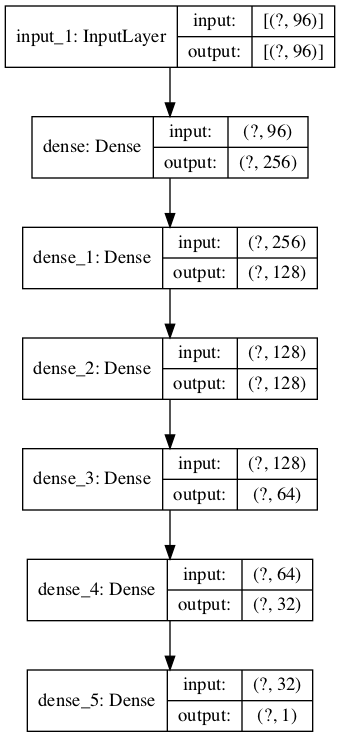

In [40]:
import pydot
plot_model(model, show_shapes=True)

In [41]:
loss = history.history['loss']
val_loss = history.history['val_loss']
go.Figure([go.Scatter(x=np.arange(len(loss)), y=loss, name="loss"),
          go.Scatter(x=np.arange(len(val_loss)), y=val_loss, name="val_loss")],
          layout={"title": "train/val loss during training"}).show()

## Simple Keras NN summary
This NN has outperformed both xgboost model and fastai model.  
It is currently the best model yet.   
However, it took some Hyperparameter tuning for the activation layers and the number of layers/size of the layers.


In [42]:
MODELS["DENSE_NN"] = {"dataset": s_features, "model": KerasWrapper(model)}

## Sequence LSTM prediction
LSTM is a type of RNN layer. 
I have a detailed lstm example and explanation slideshow in this git.
I can use the LSTM on a time-sequence (raw) data in order to predict the future
I have used [this](https://www.tensorflow.org/tutorials/structured_data/time_series) tensorflow tutorial about using lstm in keras for time series forcasting

During the work on this model I ran into a problem - the model was overfitting. 
To solve it I tried to use technical solutions like adding dropout and reducing the size of trainable pameters. 

In [43]:
train = s_prices.train(symbol).drop(columns="symbol").dropna()
val = s_prices.val(symbol).drop(columns="symbol").dropna()

train, val = scale_tv(train, val)

X, y = get_X_y(train)
Xval, yval = get_X_y(val)

train_dataset = timeseries_dataset_from_array(
    X.values,
    y.values,
    sequence_length=window, 
    sequence_stride=1,
    batch_size=3)

val_dataset = timeseries_dataset_from_array(
    Xval.values,
    yval.values,
    sequence_length=window, 
    sequence_stride=1,
    batch_size=1000)

In [44]:
tf.random.set_seed(42)
# Model
l = inputs = layers.Input(shape = (window, X.shape[-1]))
# Define small temporal Conv layer
l = layers.Conv1D(16, kernel_size=3, activation="relu")(l)
l = layers.MaxPool1D()(l)
# define a small LSTM layer
l = layers.LSTM(12, dropout=0.3)(l)
l = layers.Dense(8)(l)
l = layers.Dense(4)(l)
# Define the output
outputs = l = layers.Dense(1)(l)

model = Model(inputs, outputs)

model.compile(loss="mse", metrics=["mape", "mae"],)
history = model.fit(train_dataset, epochs=300, 
          callbacks=[callbacks.EarlyStopping(patience=10, restore_best_weights=True)], 
          validation_data=val_dataset)


# Fit again with lower learning rate to fit the data better
model.compile(loss="mse", 
              optimizer = optimizers.RMSprop(learning_rate=0.0005), 
              metrics = ["mae", "mape"])
model.fit(train_dataset,
          epochs=300,
          callbacks=[ callbacks.EarlyStopping(patience=10, restore_best_weights=True)],
          validation_data=val_dataset)

class KerasTimeSeriesWrapper:
    def __init__(self, model):
        self.model = model
    @staticmethod
    def predict(X):
        dataset = timeseries_dataset_from_array(
            X.values, None,
            sequence_length=window, 
            sequence_stride=1,
            batch_size=1)
        return model.predict(dataset).ravel()


ytrue = pd.Series(np.array([i for _, i in val_dataset]).ravel())
ypred = pd.Series(model.predict(val_dataset).ravel())
clear_output()
display(score(ytrue, ypred))
plot_ys(pd.Series(),ytrue, ypred)

{'mean_absolute_percentage_error': 36.678543,
 'mean_absolute_error': 0.11607564,
 'mean_squared_error': 0.02476557}

<ipython-input-44-7306519233dd>:48: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [45]:
model.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 30, 5)]           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 28, 16)            256       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 14, 16)            0         
_________________________________________________________________
lstm (LSTM)                  (None, 12)                1392      
_________________________________________________________________
dense_6 (Dense)              (None, 8)                 104       
_________________________________________________________________
dense_7 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_8 (Dense)              (None, 1)                

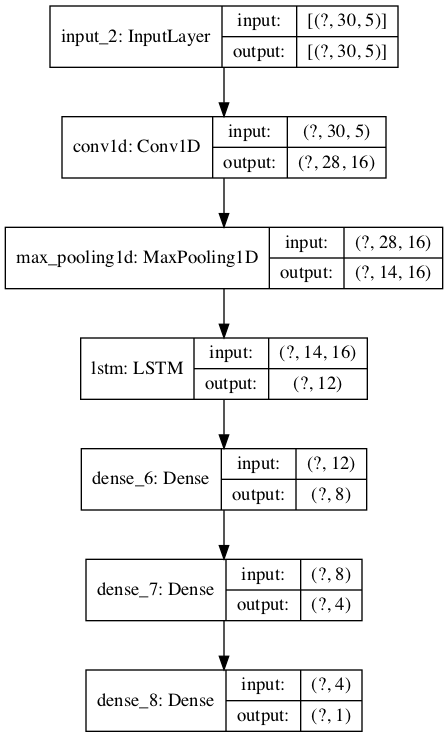

In [46]:
plot_model(model, show_shapes=True)

In [47]:
loss = history.history['loss']
val_loss = history.history['val_loss']
go.Figure([go.Scatter(x=np.arange(len(loss)), y=loss, name="loss"),
          go.Scatter(x=np.arange(len(val_loss)), y=val_loss, name="val_loss")],
          layout={"title": "train/val loss during training"}).show()

## Sequence model summary
This model have a worse results than the Dense NN model. I believe the reason is I did not use the data with the features engeneered, but I used the raw data.
Combining this with the fact that I used a very small amount of data, I believe this is a very good result for such a complicated network with so many parameters.
This model has even **less** data than all the rest, since I splitted the data windows, making each 30 day 1 sample of data (and later I made that 3 samples). It also still suffer from a small overfitting, as seen in the previous plot. 

In [48]:
MODELS["CRNN"] = {"dataset": s_prices, "model": model}

# Evaluation
At the begging, we I set aside a test set.  
While I used the validation set to change and adjust all the models and features, I didn't use the test set at all, mimics the current unknown future.  
Now I will test all the models performence against the test set.

In [52]:
results = []
for model_name, model_data in MODELS.items():
    data = model_data['dataset']
    model = model_data['model']
    train = data.train(symbol).drop(columns="symbol")
    test = data.test(symbol).drop(columns="symbol")
    train, test = scale_tv(train, test)  # fit on train, same as train-val.
    X, y = get_X_y(test)
    if model_name == "CRNN":
        dataset = timeseries_dataset_from_array(
                    X.values,
                    y.values,
                    sequence_length=window, 
                    sequence_stride=1,
                    batch_size=3000)
        y = pd.Series(np.array([i for _, i in dataset]).ravel())
        ypred = pd.Series(model.predict(dataset).ravel())
    else:
 
        ypred = model.predict(X)
        ypred = pd.Series(ypred, index=y.index)
        y = y[~ypred.isna()]
        ypred = ypred.loc[y.index]
    result = {"model": model_name}
    result.update(score(y, ypred))
    results.append(result)
    
display("AND THE WINNER IS...")
pd.DataFrame.from_dict(results).sort_values("mean_absolute_error")

'AND THE WINNER IS...'

,model,mean_absolute_percentage_error,mean_absolute_error,mean_squared_error
3,DENSE_NN,12.063300,0.025983,0.001155
1,XGBOOST,31.301662,0.077139,0.011258
4,CRNN,98.191956,0.104472,0.018415
2,FASTAI,58.743362,0.157135,0.038365
0,BASE,311.431783,0.605787,0.628690


## Summary
It seems that the DenseNN on the engeneered features had the best results.   
We've also seen that Xgboost has great out-of-the-box capabilites, and it performed very well, even more than the CNN/RNN network.   
However, with more data, the I expect the CNN/RNN network to be much better, and we also need to remeber that it performed on the **raw** data, while all the others performed on the data with engeneered features.  
Maybe combining them together would work well.  

It seems that our best model is 20X times better than the naive model, and our worse model is only 6X times better.

# Way forward
I feel the models discussed here give a pretty good estimation to the data.
What I think could help improving is:
1. **Add more data**   
    Using larger dataset can help the model see more 'hard points' that are very rare and unique in the data.   
    Using more data can allow us to make the model deeper and generalize better.   
2. **Combine data from multiple companies**    
    Using more companies(I just trained the models on Google) can help increasing the amount of data.      
    It can also help to avoid overfitting since each company behave the same.    
    We have also shown that different stock have correlation between each other, so adding this data in could help the model.    
3. **Ensemble methods**  
    Here we saw multiple types of models (Dense with feature engeneering, xgboost, RNN(LSTM) on raw data).   Combining the outputs of these model can help create a better model.  
4. **Embedding using AutoEncoder**    
    I could use LSTM to create an embedding to the window dataset, and create some kind of representation for the data point.  
    This could be helpful for extracting new features from the data.  
5. **TCN**  
    The article named [Knowledge-Driven Stock Trend Prediction and Explanation via Temporal Convolutional Network](https://core.ac.uk/download/pdf/222446995.pdf) seems to have some interesting results.  
    It shows how combining CNNs, RNNs and some domain specific knowledge can give uplift in the results.  
6. **Fundementals**
    Adding fundamental data can give a new feature domains to the models.    
    It could be very usefull for machine learning algorithms, since it requires a lot of different types of data looked at simulatniously, a very hard task for us humans.  
7. **Reinforcement learning**
    This models are nice, but for successfull trading it is not enough.   
    We need to have strategy, that maximize our profit for the budget we have (weather it 20K USD or 20M USD).  
    We need to know when to buy, when to sell, when to cut our losses and exit a bad investment, or to say "that's good enough" when we happen to make a profit on some stock.  
    A trained RL model can use the results from the existing model to create the best strategy that maximize the profit.   
    This type of model can be used together with the model we showed here, as input.  

# Resources
1. [Open Machine Learning Course. Topic 9. Part 1. Time series analysis in Python](#https://medium.com/open-machine-learning-course/open-machine-learning-course-topic-9-time-series-analysis-in-python-a270cb05e0b3)
2. [End to End Time Series Analysis and Modelling](#https://towardsdatascience.com/end-to-end-time-series-analysis-and-modelling-8c34f09a3014)
3. [Time Series Forecasting with Prophet](#https://towardsdatascience.com/time-series-forecasting-with-prophet-54f2ac5e722e)
4. [Prophet documentation by Facebook](#https://facebook.github.io/prophet/)
5. [Stationarity in time series analysis](https://towardsdatascience.com/stationarity-in-time-series-analysis-90c94f27322)   
6. [Trend, Seasonality, Moving Average, Auto Regressive Model : My Journey to Time Series Data with Interactive Code](https://towardsdatascience.com/trend-seasonality-moving-average-auto-regressive-model-my-journey-to-time-series-data-with-edc4c0c8284b)
7. [Forecasting Stock Prices using XGBoost](https://towardsdatascience.com/forecasting-stock-prices-using-xgboost-a-detailed-walk-through-7817c1ff536a#76fa)
8. [fraewell RNNs welcome TCNs](https://towardsdatascience.com/farewell-rnns-welcome-tcns-dd76674707c8)
9. [Knowledge-Driven Stock Trend Prediction and Explanation via Temporal Convolutional Network](https://core.ac.uk/download/pdf/222446995.pdf)

# Personal note
## My progress through this work
When I started this project I wanted to do so many different things.
* I was hoping to focus more on deep learning architectures, different approaches to solving the problem, and even a little bit of Reinforcement learning.  
* Things started to get complicated as I dived in into the world of time series analysis.  
  There are so many approches to it.  
* As I started looking for resources, there was so much information - stationary vs non-stationary, different features, rolling functions, normalizations, etc.  
* Until I figured all of that out, I had so little time left.  
  At the beggining I tried to predict all the different stocks, for the next day price.  
* Then I wanted to refocus and decided to predict only the 5 next days for the min/max/avg price. 
  Even that was a lot, so I really needed to focus there, and decided to stick to the mean value, for the next 5     days.  
  I think it was a little bit a waste of time, since I had to define the task clearly and focus on that.  

* It was important to me to be organized with the data and comparison methods.  
  Already  in the start I insisted on splitting the data to train/test sets, in order to check that the models really work. 
  I think it was one of the things I performed really good here.

* I would have liked to spend a little bit more time exploring different deep NN architecures, but when I got to that I saw that I have very few samples, and had a real problem with overfitting. 
* To move forward, I would have taken larger amount of data from a different source, and maybe combine different stocks to do that. If I would do that, I think I could make a better model with better performance.

* I really enjoyed working on this project, and really learned a lot. 
  I think for the next time I will do a datascience project I think it will be better and more defined from the beggging.    
*  I tried to make more of a POC here, with very small amounts of data, and it still took a lot of time.  
*  I think next time I will do something like that, I will rent a GPU cloud computing, and use much more data.
*  It was a real problem in this project, using this low amount of data. 
